In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scvi
from matplotlib_venn import venn2

from utils import enrich, enrichr

Global seed set to 0


In [2]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', facecolor=None)
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-04-06 18:47:25.789935: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-06 18:47:25.790153: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


In [44]:
covid = sc.read('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/211001_annot_patient_integrated.h5ad')
covid

AnnData object with n_obs × n_vars = 300353 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var'
    var: 'used_for_scvi'
    uns: 'cell_type_colors', 'hvg', 'infected_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
heumos = sc.read('/home/icb/lukas.heumos/yuge_mhv68/2022_03_09_annotated.h5ad')
heumos.obs['mut_status'] = heumos.obs['batch']  # clarify variable
heumos

AnnData object with n_obs × n_vars = 56743 × 20379
    obs: 'identifier', 'grouping', 'batch', 'name', 'sex', 'n_counts', 'n_genes', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'infected', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status'
    var: 'n_cells', 'highly_variable', 'n_counts', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Celltype group_colors', 'Spline Type_colors', 'batch_colors', 'cell_type_colors', 'cell_type_ranks', 'celltype_refined_colors', 'days_colors', 'dendrogram_cell_type', 'grouping_colors', 'gt_celltype_colors', 'gt_viralcat_colors', 'leiden', 'leiden_1_5_colors', 'leiden_1_colors', 'leiden_2_colors', 'louvain', 'name_colors', 'neighbors', 'pca', 'rank_genes_groups', 'rank_genes_r1', 'ra

Number of mice per condition:

In [5]:
heumos.obs[['identifier', 'grouping']].groupby('grouping').nunique()

,identifier
grouping,
3d PI-KO,4
3d PI-WT,4
6d PI-KO,4
6d PI-WT,4
15d PI-KO,3
15d PI-WT,4
28d PI-KO,3
28d PI-WT,4
45d PI-KO,4


### Sanity check: should this label transfer?

In [32]:
heumos.var_names[heumos.var_names.str.startswith('IFN')]

Index(['IFNAR1', 'IFNAR2', 'IFNG', 'IFNGR1', 'IFNGR2', 'IFNK', 'IFNLR1'], dtype='object')

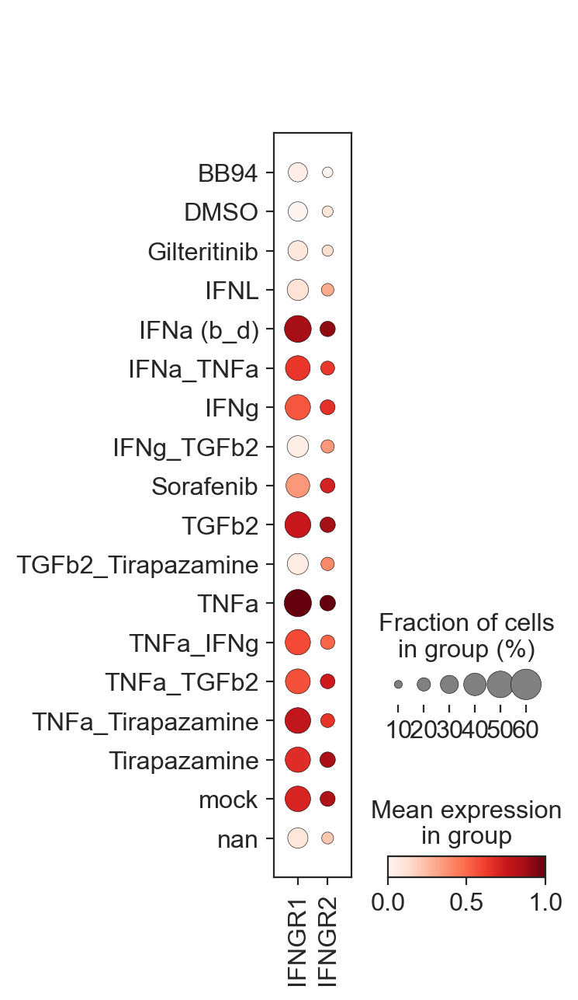

In [45]:
sc.pl.dotplot(covid, var_names=['IFNGR1', 'IFNGR2'], groupby='treatment', standard_scale='var')

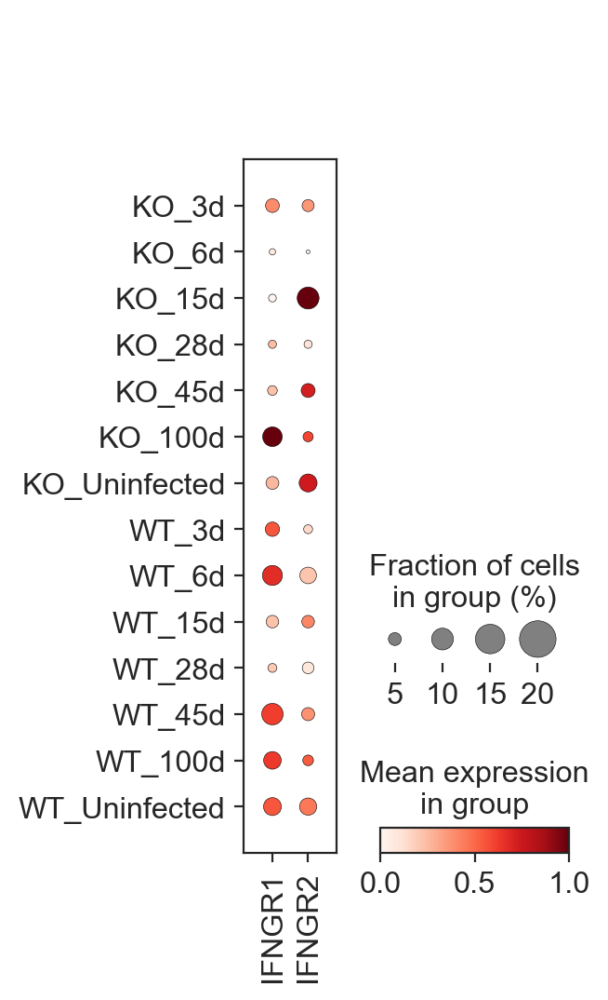

In [48]:
sc.pl.dotplot(heumos, var_names=['IFNGR1', 'IFNGR2'], groupby=['mut_status', 'days'], use_raw=False, standard_scale='var')

## Filter data and harmonize labels

Remove infected cells to isolate the IFNg signature, which is weaker than the IFNL signature.

In [45]:
covid = covid[covid.obs.infected == 'False']
covid

View of AnnData object with n_obs × n_vars = 110209 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var'
    var: 'used_for_scvi'
    uns: 'cell_type_colors', 'hvg', 'infected_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

Check that IFNg is represented across all batches:

In [46]:
pd.crosstab(covid.obs.treatment, covid.obs.patient)

patient,patient_1,patient_2,patient_3,patient_4
treatment,,,,
BB94,0,0,0,1738
Gilteritinib,0,0,0,1956
IFNL,0,0,2271,2953
IFNa (b_d),2109,3029,2465,2230
IFNa_TNFa,1957,0,3168,1858
IFNg,2303,2502,2879,2335
IFNg_TGFb2,0,0,2162,2023
Sorafenib,1695,0,3173,3159
TGFb2,1973,1151,2636,2453


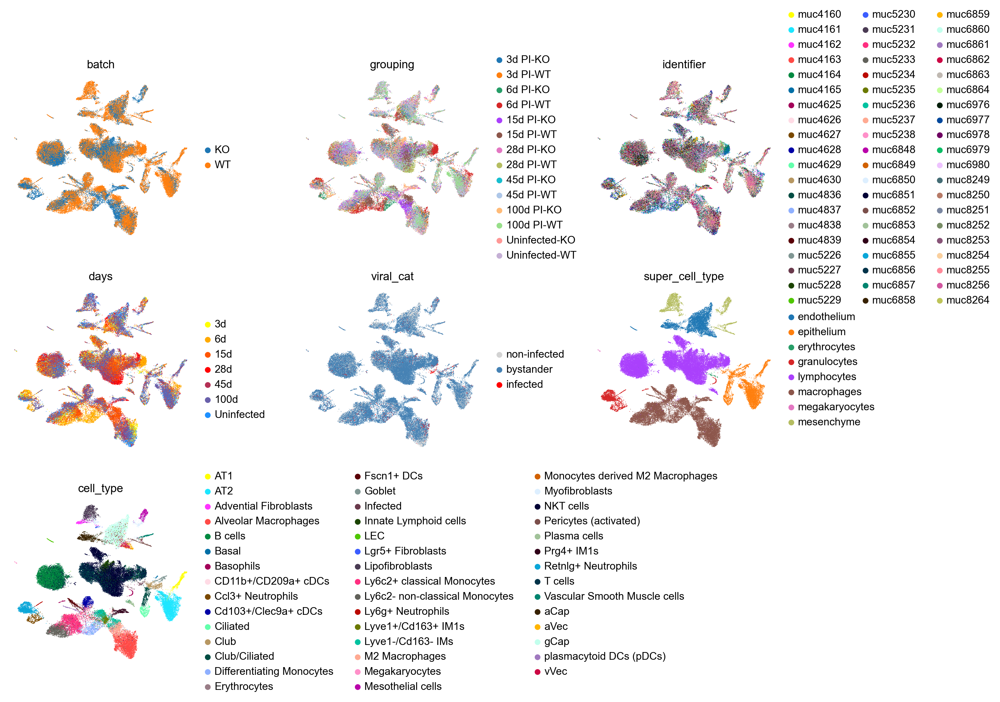

In [8]:
sc.pl.umap(heumos, color=['batch', 'grouping', 'identifier', 'days', 'viral_cat', 'super_cell_type', 'cell_type'], wspace=.4, ncols=3)

Subset heumos to epithelial cells.

In [9]:
heumos = heumos[heumos.obs.super_cell_type == 'epithelium']
heumos

View of AnnData object with n_obs × n_vars = 5766 × 20379
    obs: 'identifier', 'grouping', 'batch', 'name', 'sex', 'n_counts', 'n_genes', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'infected', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status'
    var: 'n_cells', 'highly_variable', 'n_counts', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Celltype group_colors', 'Spline Type_colors', 'batch_colors', 'cell_type_ranks', 'celltype_refined_colors', 'days_colors', 'dendrogram_cell_type', 'grouping_colors', 'gt_celltype_colors', 'gt_viralcat_colors', 'leiden', 'leiden_1_5_colors', 'leiden_1_colors', 'leiden_2_colors', 'louvain', 'name_colors', 'neighbors', 'pca', 'rank_genes_groups', 'rank_genes_r1', 'rank_genes_r1_5

In [10]:
# recompute UMAP for clearer plot (thanks Karin!)
sc.pp.neighbors(heumos)
sc.tl.umap(heumos)

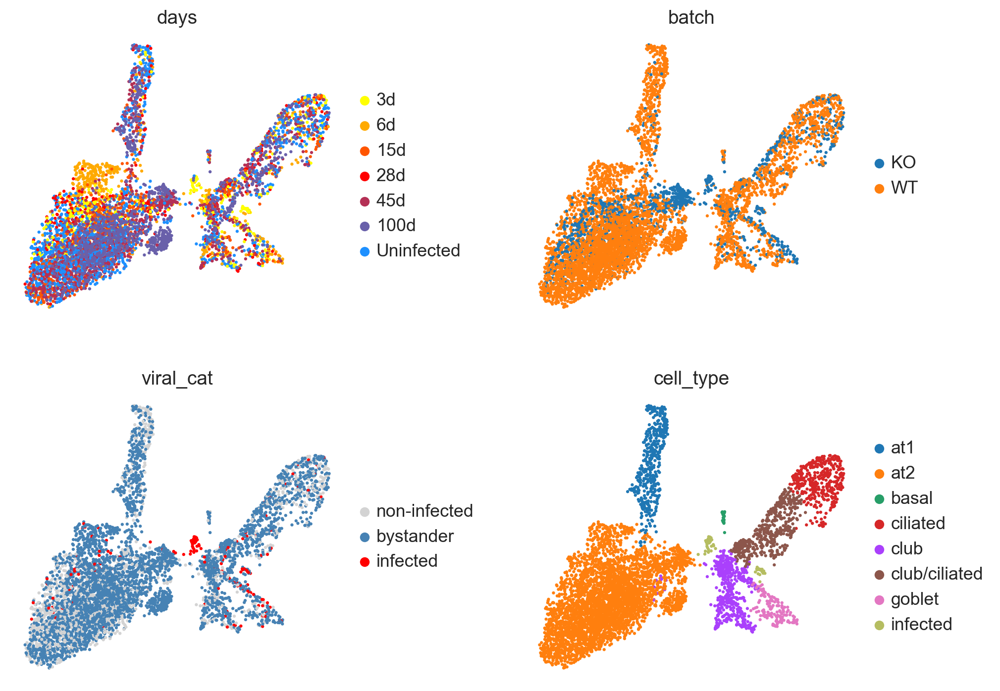

In [244]:
sc.pl.umap(heumos, color=['days', 'batch', 'viral_cat', 'cell_type'], wspace=.4, ncols=2)

Convert mouse genes to human gene names via capitalization(?).

In [12]:
heumos.var_names = pd.Series(heumos.var_names).str.upper().values

Harmonized cell type names.

In [13]:
heumos.obs['cell_type'] = [s.lower() for s in heumos.obs['cell_type']]

Label batches.

In [47]:
heumos.obs['batch_data'] = 'heumos'
covid.obs['batch_data'] = covid.obs['patient']

Trying to set attribute `.obs` of view, copying.


### Combine data

In [105]:
adata = covid.concatenate(heumos, uns_merge='first')
adata

AnnData object with n_obs × n_vars = 115975 × 13732
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'grouping', 'sex', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status', 'treatment_predicted'
    var: 'used_for_scvi-0', 'n_cells-1', 'highly_variable-1', 'n_counts-1', 'Accession-1', 'Chromosome-1', 'End-1', 'Start-1', 'Strand-1'
    uns: 'cell_type_colors', 'hvg', 'infected_colors', 'leiden', 'lei

In [106]:
adata.X = adata.layers['counts']
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 115975 × 13732
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'grouping', 'sex', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status', 'treatment_predicted'
    var: 'used_for_scvi-0', 'n_cells-1', 'highly_variable-1', 'n_counts-1', 'Accession-1', 'Chromosome-1', 'End-1', 'Start-1', 'Strand-1'
    uns: 'cell_type_colors', 'hvg', 'infected_colors', 'leiden', 'lei

Calculate highly variable genes so we can plot the overlap with actual training genes.

In [107]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, subset=False, batch_key='batch_data')

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'identifier' as categorical
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'name' as categorical
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will b

## learn IFNg genes "manually" with a linear classifier

In [51]:
from sklearn.linear_model import LogisticRegression

In [52]:
%%time
clf = LogisticRegression(solver='saga')

subset = adata[adata.obs.treatment.isin(['IFNg', 'mock'])]  # covid data only
clf.fit(subset.X.toarray(), subset.obs.treatment.values)
clf.classes_

CPU times: user 5min 19s, sys: 7.11 s, total: 5min 26s
Wall time: 5min 27s


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


array(['IFNg', 'mock'], dtype=object)

Check performance on training data.

In [53]:
clf.score(subset.X.toarray(), subset.obs.treatment.values)

0.9951448519380467

Almost perfect performance on the training data, so this is almost guaranteed very overfit, unfortunately. But scANVI should be able to parse out irrelevant variables.

Instead of training and trying to integrate on highly variable genes, we'll instead subset the data to the set of genes which were the strongest markers for IFNg.

In [54]:
from external_utils import define_marker_genes

-0.15208197981119156

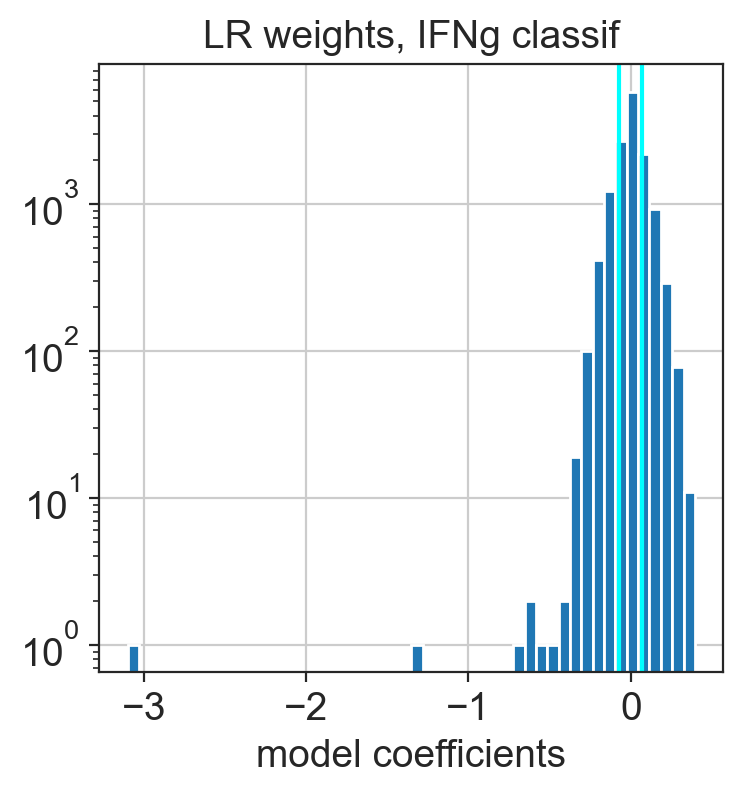

In [108]:
define_marker_genes(adata, clf)
plt.title('LR weights, IFNg classif')

np.quantile(clf.coef_[0], .05)

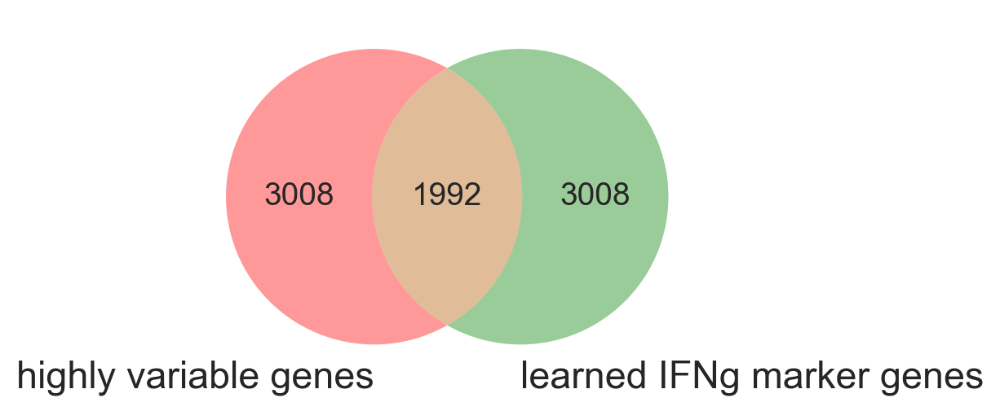

In [109]:
venn2(
    [set(adata.var_names[adata.var['highly_variable']]), set(adata.var_names[adata.var['marker_genes']])], 
    set_labels=['highly variable genes', 'learned IFNg marker genes']
)

Subset.

In [110]:
adata = adata[:, adata.var['marker_genes'] == True]
adata

View of AnnData object with n_obs × n_vars = 115975 × 5000
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'grouping', 'sex', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status', 'treatment_predicted'
    var: 'used_for_scvi-0', 'n_cells-1', 'highly_variable-1', 'n_counts-1', 'Accession-1', 'Chromosome-1', 'End-1', 'Start-1', 'Strand-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

In [112]:
# set unknown label for scanvi
adata.obs["treatment_scanvi"] = 'Unknown'
heumos_idx = adata.obs['batch_data'] != "heumos"
adata.obs["treatment_scanvi"][heumos_idx] = adata.obs.treatment[heumos_idx]

Trying to set attribute `.obs` of view, copying.
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [113]:
scvi.model.SCANVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="batch_data",
    labels_key="treatment_scanvi",
)

INFO     Using batches from adata.obs["batch_data"]                                          
INFO     Using labels from adata.obs["treatment_scanvi"]                                     
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 115975 cells, 5000 vars, 5        
         batches, 17 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


## Train scANVI

In [60]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
    n_latent=30,
)

lvae_lr = scvi.model.SCANVI(adata, "Unknown", **arches_params)
lvae_lr.train(early_stopping=True, max_epochs=40)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."


INFO     Training for 40 epochs.                                                             


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 1/40:   0%|                                                                                                                                                                                                                    | 0/40 [00:00<?, ?it/s]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/distributions/_negative_binomial.py:435: UserWarning: The value argument must be within the support of the distribution
  UserWarning,


Epoch 40/40: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [34:16<00:00, 51.42s/it, loss=2.12e+03, v_num=1]


In [61]:
lvae_lr.module

SCANVAE(
  (z_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=5005, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
        (Layer 1): Sequential(
          (0): Linear(in_features=133, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
      )
    )
    (mean_encoder): Linear(in_features=128, out_features=30, bias=True)
    (var_encoder): Linear(in_features=128, out_features=30, bias=True)
  )
  (l_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=5005, out_features=128, bias=True)
          (1): None
          (2): La

Save the model.

In [62]:
lvae_lr.save('2022-03-30_scanvi_IFNg_genes_heumos_map', overwrite=True, save_anndata=True)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'treatment_scanvi' as categorical


## Predict

In [114]:
adata.obs["treatment_predicted"] = lvae_lr.predict(adata)
adata.obsm["X_scANVI"] = lvae_lr.get_latent_representation(adata)

INFO     Using data from adata.layers["counts"]                                              


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/data/_anndata.py:1234: UserWarning: Categorical encoding for label is similar but not equal between the anndata used to train and the anndata passed in. Will attempt transfer. Expected categories: ['BB94' 'Gilteritinib' 'IFNL' 'IFNa (b_d)' 'IFNa_TNFa' 'IFNg' 'IFNg_TGFb2'
 'Sorafenib' 'TGFb2' 'TGFb2_Tirapazamine' 'TNFa' 'TNFa_IFNg' 'TNFa_TGFb2'
 'TNFa_Tirapazamine' 'Tirapazamine' 'mock' 'Unknown']. Received categories: ['BB94' 'Gilteritinib' 'IFNL' 'IFNa (b_d)' 'IFNa_TNFa' 'IFNg' 'IFNg_TGFb2'
 'Sorafenib' 'TGFb2' 'TGFb2_Tirapazamine' 'TNFa' 'TNFa_IFNg' 'TNFa_TGFb2'
 'TNFa_Tirapazamine' 'Tirapazamine' 'Unknown' 'mock'].
 
  warnings.warn(warning_

INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 115975 cells, 5000 vars, 5        
         batches, 17 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  


In [115]:
%%time
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

CPU times: user 4min 53s, sys: 1min 30s, total: 6min 24s
Wall time: 1min 59s


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'treatment_predicted' as categorical
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'treatment_scanvi' as categorical


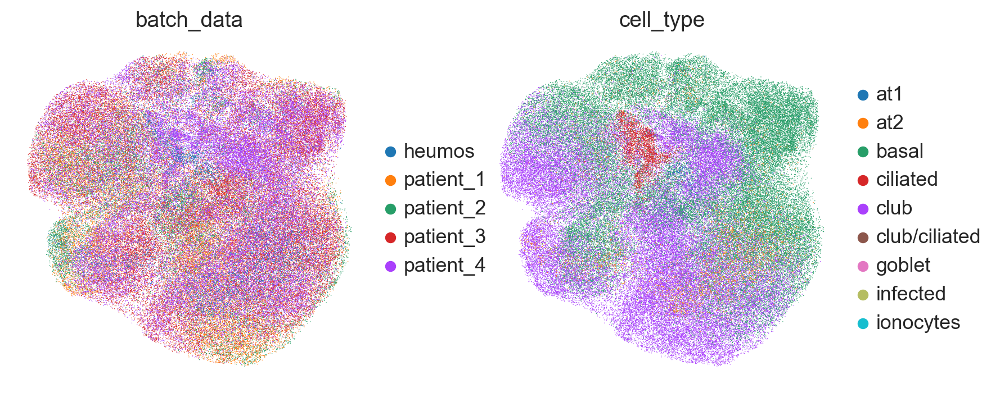

ValueError: new categories must not include old categories: {'#d3d3d3ff'}

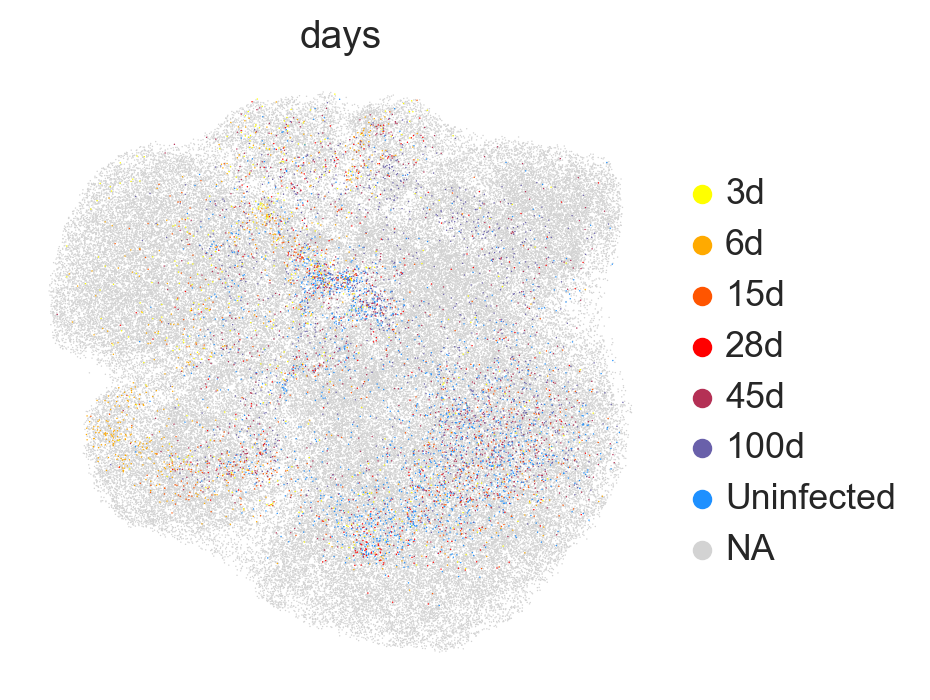

In [116]:
sc.pl.umap(adata, color=['batch_data', 'cell_type'])
sc.pl.umap(adata, color=['days', 'viral_cat', 'treatment', 'treatment_predicted'], wspace=.6)

Map back to the original mouse adata to gain an intuition on potential cell subpopulations.

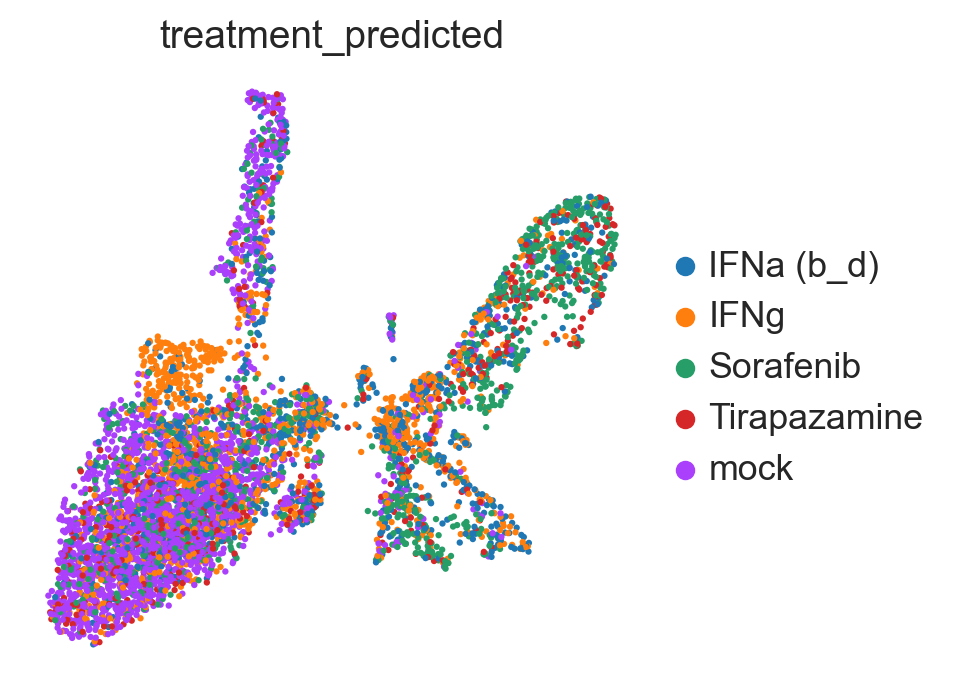

In [118]:
heumos.obs['treatment_predicted'] = adata[adata.obs.batch_data == 'heumos'].obs['treatment_predicted'].values
sc.pl.umap(heumos, color='treatment_predicted')

### Predict proba

We'll now try to get a better interpretation by using the probabilities directly.

In [119]:
z1 = lvae_lr.get_latent_representation()
preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
print(preds.shape)

# add proba per class to `.obs`
treatment_index_dict = dict(zip(adata.obs.treatment.cat.categories, range(preds.shape[1])))
for i in range(preds.shape[1]):
    adata.obs[f'classifier_proba_{adata.obs.treatment.cat.categories[i]}'] = preds[:, i]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."


(115975, 16)


Now let's look how how scoring actually worked out for the heumos dataset.

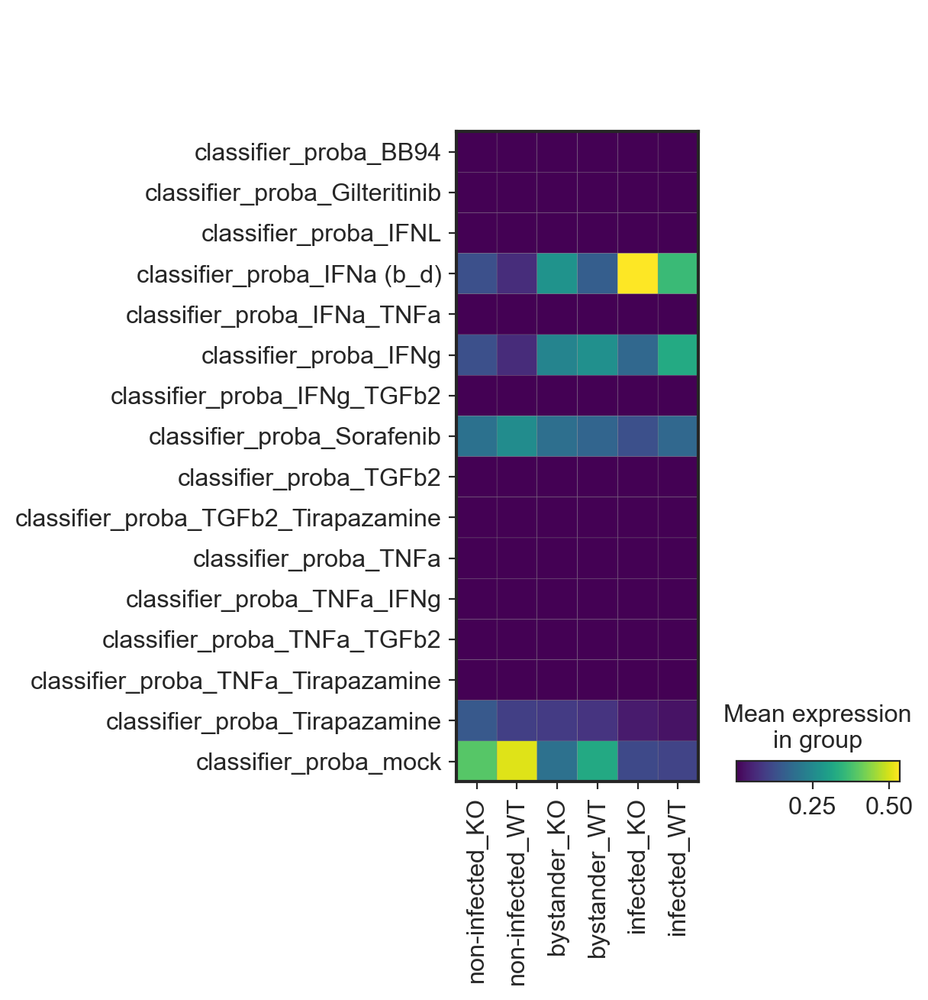

In [120]:
sc.pl.matrixplot(
    adata[adata.obs.batch_data == 'heumos'],
    groupby=['viral_cat', 'mut_status'],
    var_names=[f'classifier_proba_{adata.obs.treatment.cat.categories[i]}' for i in range(preds.shape[1])],
    swap_axes=True
)

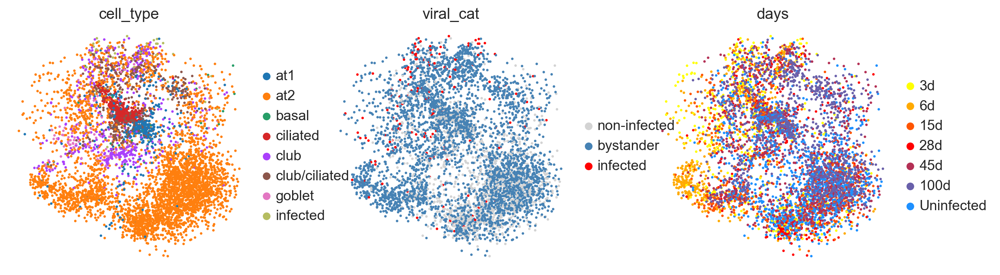

In [121]:
sc.pl.umap(adata[adata.obs.batch_data == 'heumos'], color=['cell_type', 'viral_cat', 'days'])

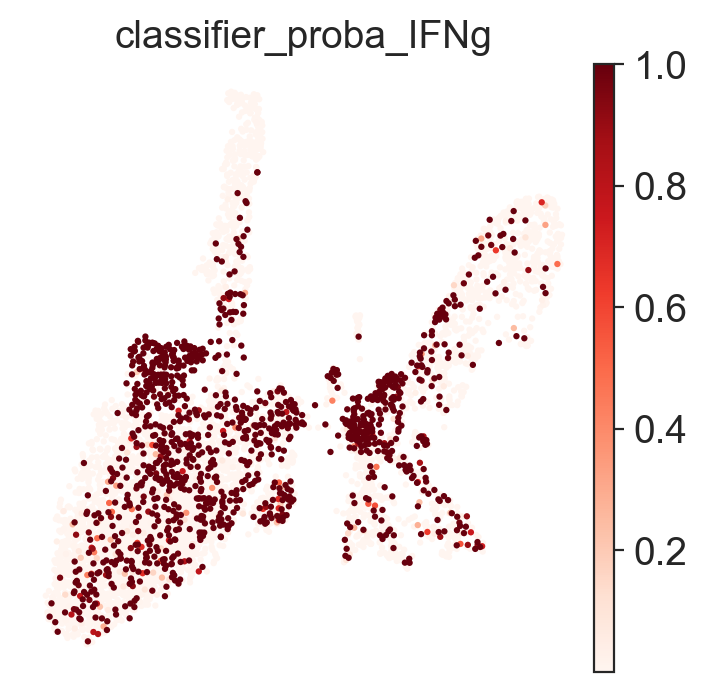

In [246]:
heumos.obs['classifier_proba_IFNg'] = adata[adata.obs.batch_data == 'heumos'].obs['classifier_proba_IFNg'].values
sc.pl.umap(heumos, color='classifier_proba_IFNg', cmap='Reds')

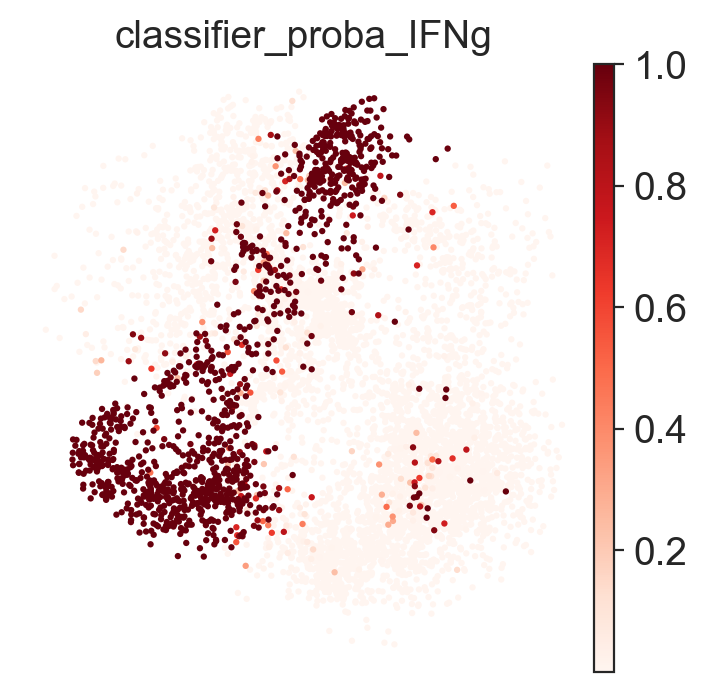

In [122]:
sc.pl.umap(adata[adata.obs.batch_data == 'heumos'], color='classifier_proba_IFNg', color_map='Reds')

Question: what proportions of the phenotypes are occuring in the cell subpopulations?

In [123]:
sc.tl.leiden(adata, key_added='leiden_merge')

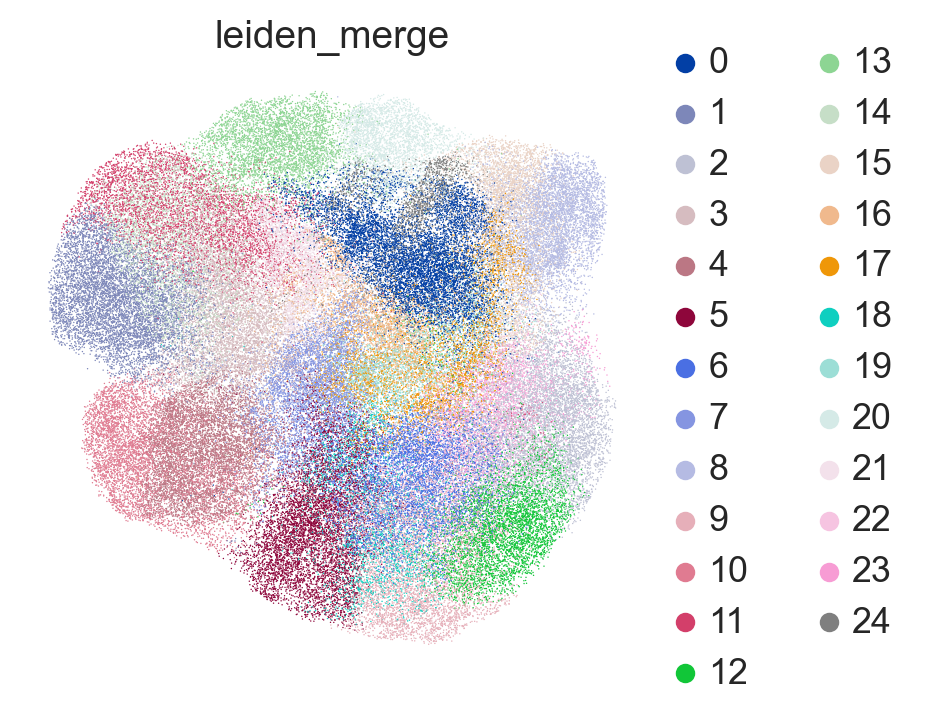

In [124]:
sc.pl.umap(adata, color='leiden_merge')

In [74]:
from external_utils import plot_proportions

Plot the proportions of each phenotype per cell type in the heumos dataset.

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


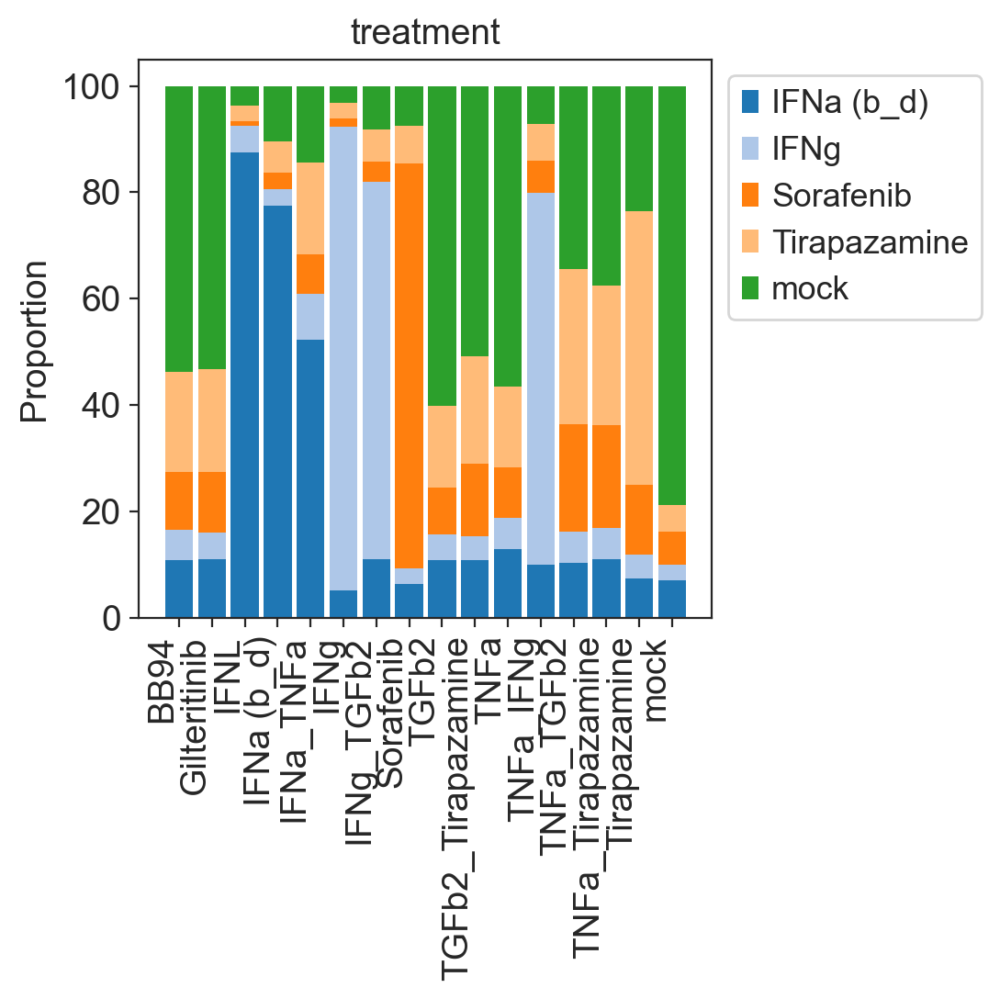

In [75]:
# check if the original treatment label was re-labeled correctly - yes
plot_proportions(adata[adata.obs.batch_data == 'patient_4'], 'treatment_predicted', 'treatment')

Check that IFN response is higher in bystanding and infected cells:

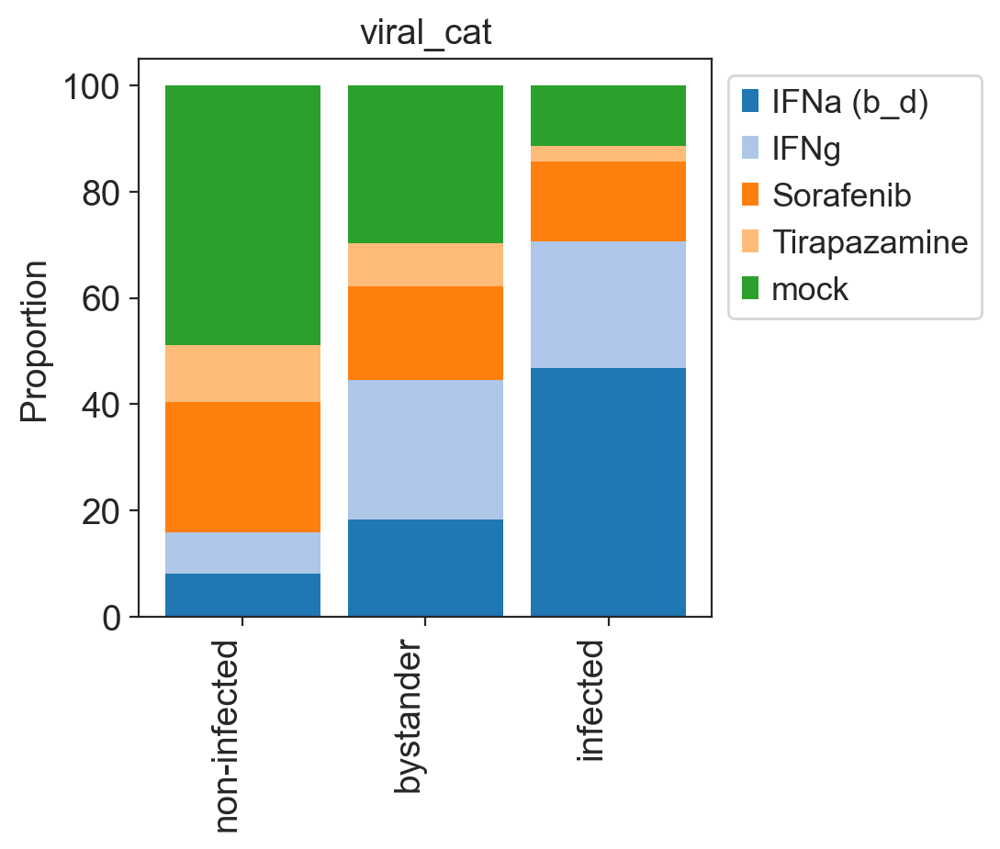

In [76]:
plot_proportions(adata[adata.obs.batch_data == 'heumos'], 'treatment_predicted', 'viral_cat')

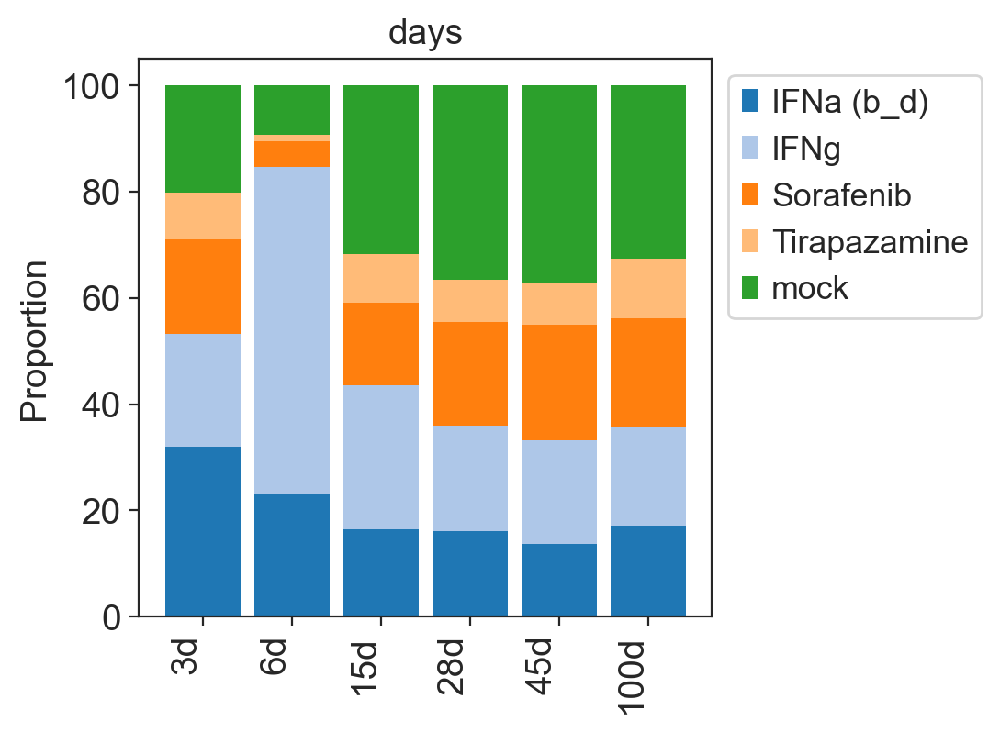

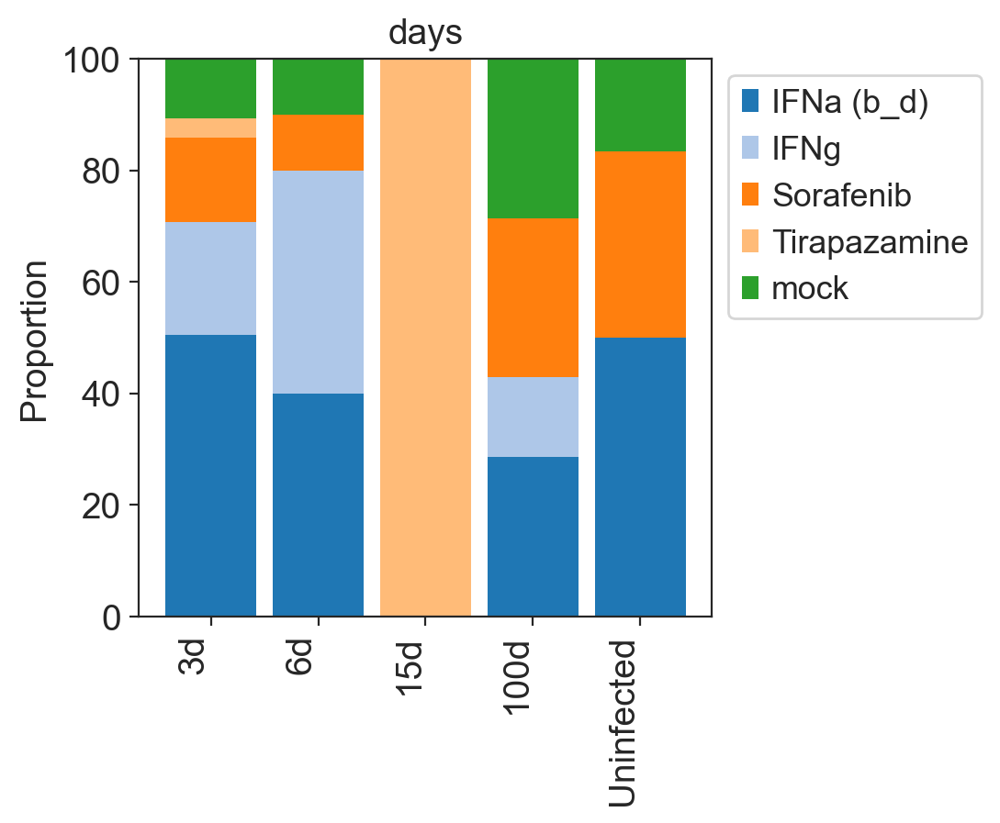

In [81]:
plot_proportions(adata[(adata.obs.batch_data == 'heumos') & (adata.obs.viral_cat == 'bystander')], 'treatment_predicted', 'days')
plot_proportions(adata[(adata.obs.batch_data == 'heumos') & (adata.obs.viral_cat == 'infected')], 'treatment_predicted', 'days')

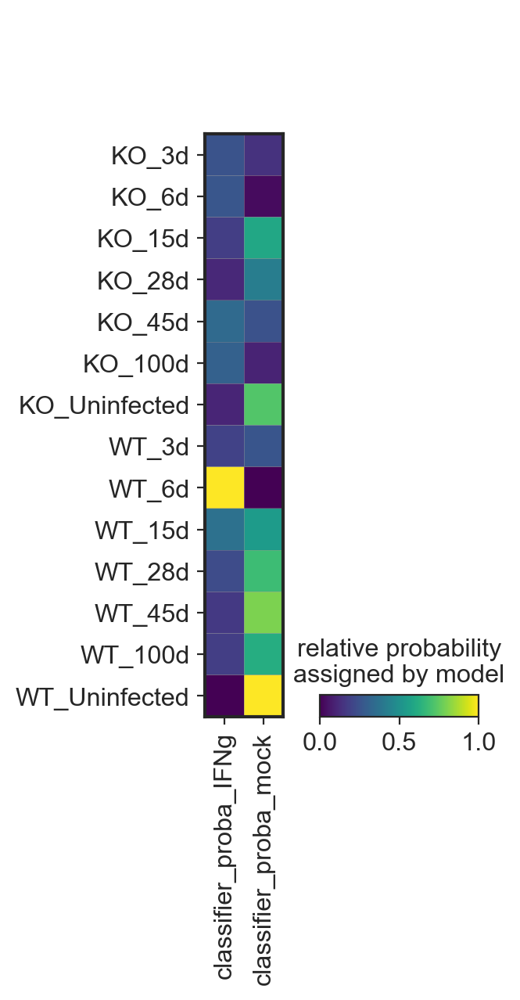

In [96]:
sc.pl.matrixplot(
    adata[adata.obs.batch_data == 'heumos'],
    var_names=['classifier_proba_IFNg', 'classifier_proba_mock'],
    groupby=['mut_status', 'days'], standard_scale='var',
    colorbar_title='relative probability\nassigned by model'
)

TODO: Map to original leiden clustering, which was not on the IFNg gene set space.

### Calculate feature importance on heumos

In [137]:
# z1 = lvae_lr.get_latent_representation(subset)
# preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
# for i in range(preds.shape[1]):
#     subset.obs[f'classifier_proba_{subset.obs.treatment.cat.categories[i]}'] = preds[:, i]

#### via permutation on single genes

Inspired by the implementation proposed in Fisher, Rudin, Dominici (2018) https://arxiv.org/abs/1801.01489

Set the shuffle indices to be consistent throughout each permutation.

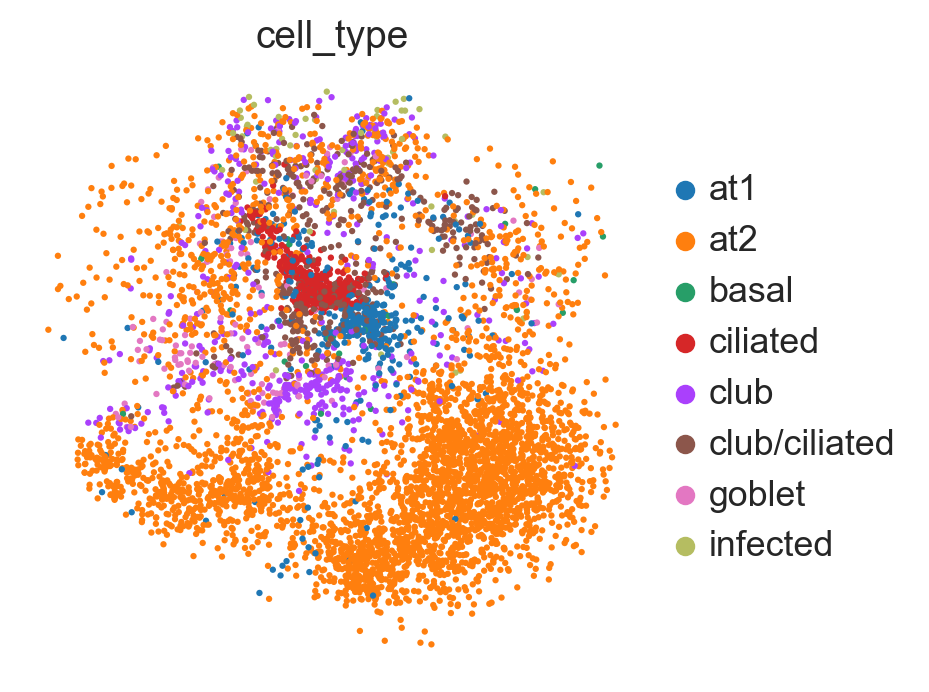

In [203]:
subset = adata[adata.obs.batch_data == 'heumos']
sc.pl.umap(subset, color='cell_type')

In [207]:
import random
indices = subset.obs.index.values.copy()
random.shuffle(indices)

Iteratively switch the values and predict.

In [212]:
shuffled_counts = subset[indices].layers['counts']
IFNg_values = subset.obs['classifier_proba_IFNg'].values

In [223]:
%%time
import gc
change_mat = []
for i, gene in enumerate(subset.var_names):
    # permute one gene in the adata
    new_adata = subset.copy()
    new_adata.layers['counts'][:, i] = shuffled_counts[:, i]
    # get prediction probabilities
    z1 = lvae_lr.get_latent_representation(new_adata)
    preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
    change_mat.append(IFNg_values - preds[:, treatment_index_dict['IFNg']])

    # I have a leak oof
    if i % 200 == 0:
        gc.collect()

CPU times: user 6h 49min 12s, sys: 6min 12s, total: 6h 55min 24s
Wall time: 17min 25s


In [225]:
import anndata as ad
import scipy
feature_adata = ad.AnnData(X=scipy.sparse.csr_matrix(np.array(change_mat).T), obs=subset.obs.copy(), var=subset.var.copy())
feature_adata.obsm = subset.obsm.copy()
feature_adata.write('2022-04-01_scanvi_IFNg_genes_heumos_feature_adata.h5ad')

In [226]:
feature_adata

AnnData object with n_obs × n_vars = 5766 × 5000
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'grouping', 'sex', 'percent.mito', 'percent.viral', 'S_score', 'G2M_score', 'phase', 'louvain', 'days', 'pseudotime', 'spline_types', 'Spline Type', 'Celltype group', 'days_numeric', 'celltype_refined', 'viral_cat', 'gt_viralcat', 'gt_celltype', 'leiden_1', 'leiden_1_5', 'leiden_2', 'super_cell_type', 'group', 'de_cell_type_group', 'de_grouping', 'mut_status', 'treatment_predicted', 'treatment_scanvi', 'classifier_proba_BB94', 'classifier_proba_Gilteritinib', 'classifier_proba_IFNL', 'classifier_proba_IFNa (b_d)', 'classifier_proba_IFNa_TNFa', 'classifier_proba_IFNg', 'classifier_proba_IF

### Plot feature importance

Plot the features with the largest total effect on the IFNg probability. These were the features which most greatly contributed to IFNg prediction across all samples. The sign of the difference is a biological artifact so we will take the magnitude.

In [227]:
feature_adata.layers['abs'] = np.abs(feature_adata.X.toarray())
feature_adata.var['sum'] = feature_adata.layers['abs'].sum(axis=0)

In [228]:
feature_adata.var.sort_values(by='sum', ascending=False).head(10)

,used_for_scvi-0,n_cells-1,highly_variable-1,n_counts-1,Accession-1,Chromosome-1,End-1,Start-1,Strand-1,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,coef,marker_genes,sum
CD74,True,19030,True,37841.320312,ENSMUSG00000024610,18,60812652,60803848,+,True,2.472878,2.724442,0.959593,4,False,-1.312049,True,569.711975
B2M,True,27878,True,57642.359375,ENSMUSG00000060802,2,122153083,122147686,+,True,3.660814,3.580020,1.103918,4,False,-3.098773,True,275.360504
PSMB9,False,10858,False,7492.928223,ENSMUSG00000096727,17,34187764,34181987,-,True,0.831818,1.731691,1.090847,5,True,-0.630320,True,181.925385
PSMB8,False,15063,True,13549.878906,ENSMUSG00000024338,17,34201454,34197721,+,True,1.084110,1.513615,0.392965,4,False,-0.278839,True,168.238739
PSME1,False,15709,False,12246.756836,ENSMUSG00000022216,14,55581529,55578123,+,False,1.494360,1.466327,-0.293582,0,False,-0.324432,True,163.433090
IRF1,True,8261,True,6307.562988,ENSMUSG00000018899,11,53778374,53770014,+,True,0.829728,1.836413,1.523904,5,True,-0.572913,True,146.259308
TAP1,True,7926,True,5075.862793,ENSMUSG00000037321,17,34197225,34187553,+,True,0.564736,1.530453,0.901996,3,False,-0.644020,True,128.698944
IFI27,True,6616,False,3852.032959,ENSMUSG00000064215,12,103440239,103434211,+,True,2.204842,3.219444,1.964810,4,False,-0.076649,True,124.058754
STAT1,False,10881,True,9652.570312,ENSMUSG00000026104,1,52161865,52119440,+,True,0.980577,1.713562,1.131787,5,True,-0.683816,True,112.070000
LY6E,False,18106,True,25252.970703,ENSMUSG00000022587,15,74959905,74955051,+,True,2.367596,2.057656,0.378121,2,False,0.143134,True,105.431900


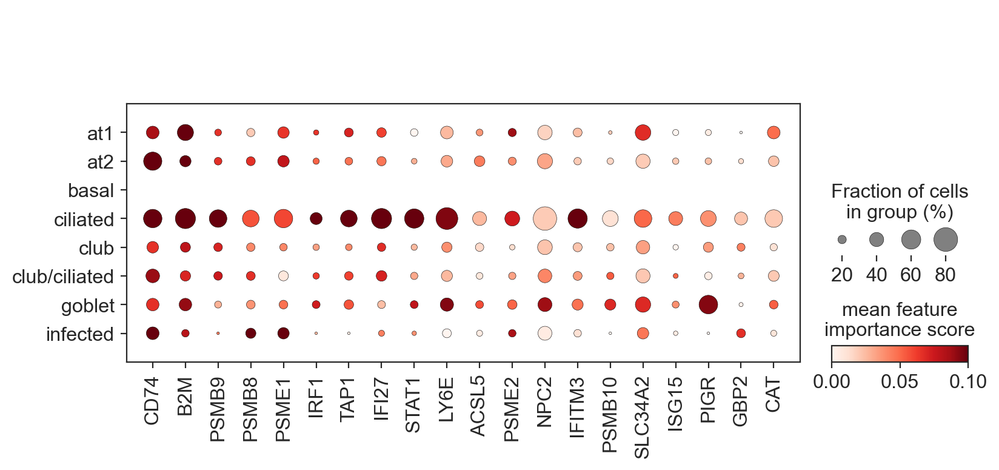

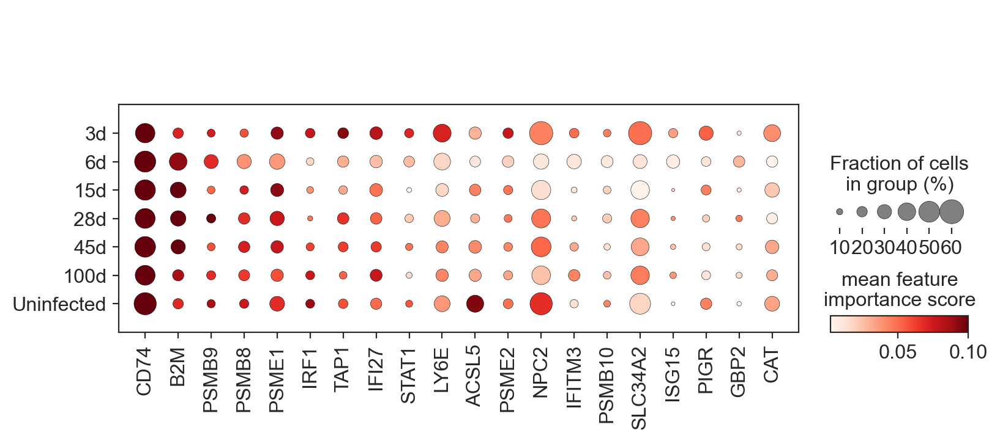

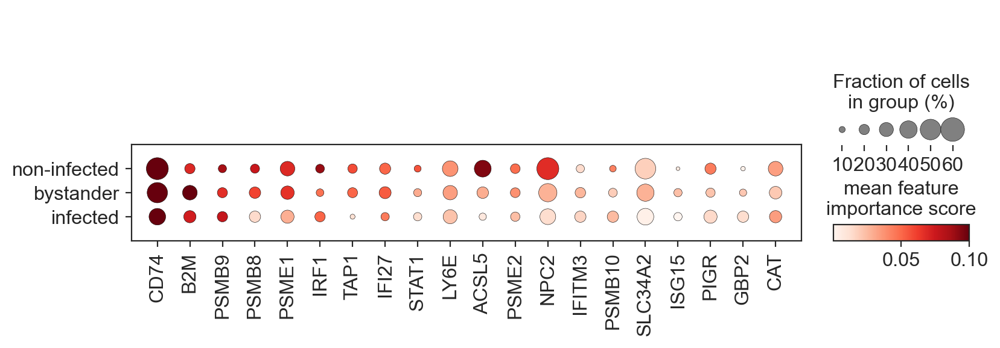

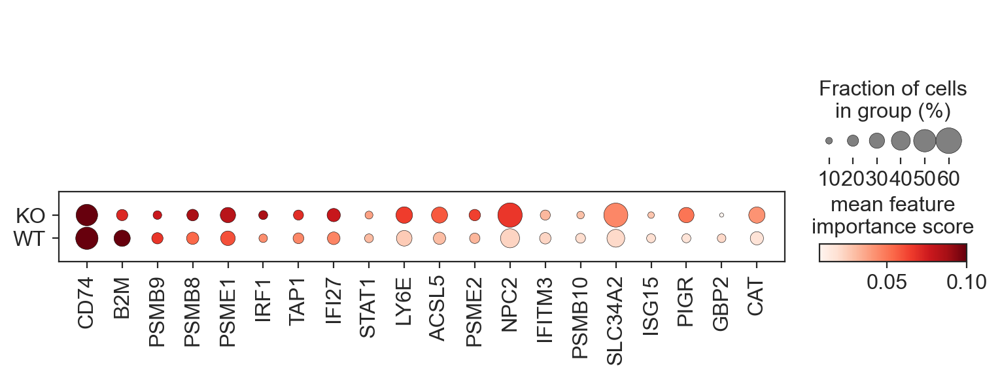

In [233]:
sig_genes = feature_adata.var.sort_values(by='sum', ascending=False).index[:20]
for gb in ['cell_type', 'days', 'viral_cat', 'mut_status']:
    sc.pl.dotplot(
        feature_adata[feature_adata.obs.treatment_predicted == 'IFNg'],  # importance just for the IFNg label
        var_names=sig_genes, groupby=gb, layer='abs', colorbar_title='mean feature\nimportance score',
        vmax=.1
    )

Interpret the genes via enrichment.

In [238]:
pd.set_option('max_colwidth', 60)
enrich(list(sig_genes), feature_adata.var_names.to_list()).head(10)

,name,p_value,intersections
0,antigen processing and presentation of exogenous antigen,8.125323e-12,"[CD74, B2M, PSMB9, PSMB8, PSME1, TAP1, PSME2, PSMB10]"
1,antigen processing and presentation,1.900683e-10,"[CD74, B2M, PSMB9, PSMB8, PSME1, TAP1, PSME2, PSMB10]"
2,antigen processing and presentation of exogenous peptide...,2.064935e-08,"[CD74, B2M, PSMB9, PSMB8, TAP1, PSMB10]"
3,antigen processing and presentation of peptide antigen,7.590960e-08,"[CD74, B2M, PSMB9, PSMB8, TAP1, PSMB10]"
4,biological process involved in interspecies interaction ...,1.692506e-07,"[CD74, B2M, PSMB9, PSMB8, IRF1, IFI27, STAT1, LY6E, NPC2..."
5,immune response,1.692506e-07,"[CD74, B2M, PSMB9, PSMB8, IRF1, TAP1, IFI27, STAT1, IFIT..."
6,immune system process,1.766156e-07,"[CD74, B2M, PSMB9, PSMB8, PSME1, IRF1, TAP1, IFI27, STAT..."
7,response to external biotic stimulus,4.676243e-07,"[CD74, B2M, PSMB9, PSMB8, IRF1, IFI27, STAT1, NPC2, IFIT..."
8,response to other organism,4.676243e-07,"[CD74, B2M, PSMB9, PSMB8, IRF1, IFI27, STAT1, NPC2, IFIT..."
9,response to biotic stimulus,5.162634e-07,"[CD74, B2M, PSMB9, PSMB8, IRF1, IFI27, STAT1, NPC2, IFIT..."


#### Sanity checks

Plot the expression of the top 3 genes on the original data.

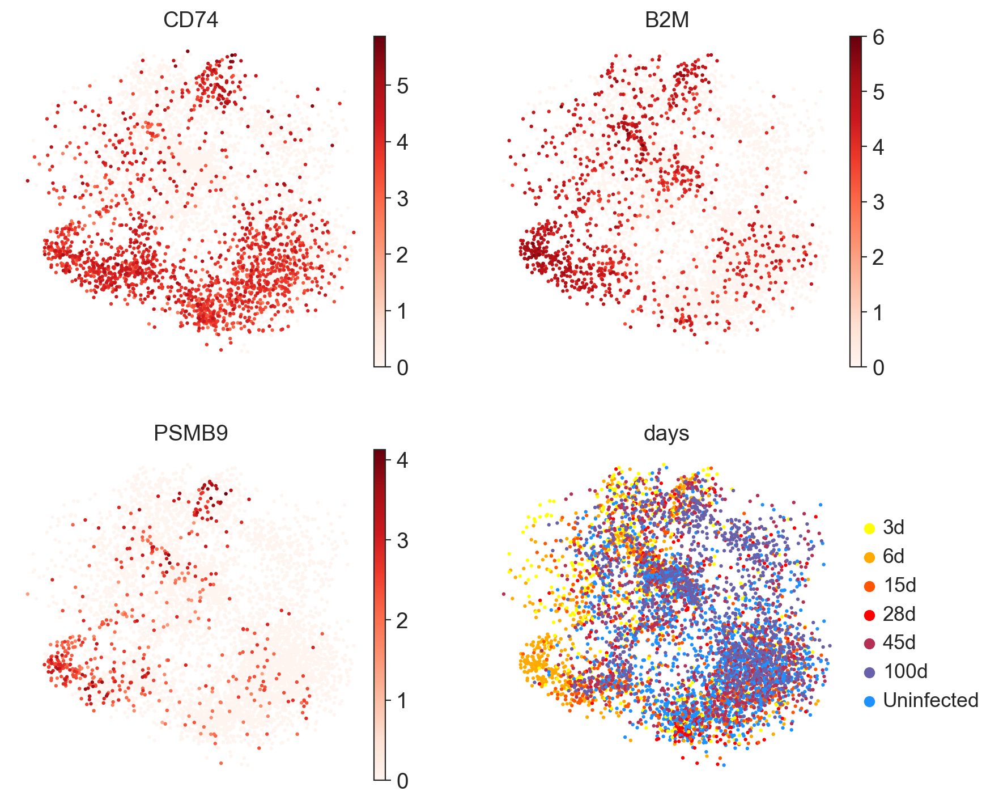

In [243]:
sc.pl.umap(subset, color=list(sig_genes[:3]) + ['days'], ncols=2, cmap='Reds', facecolor=None)

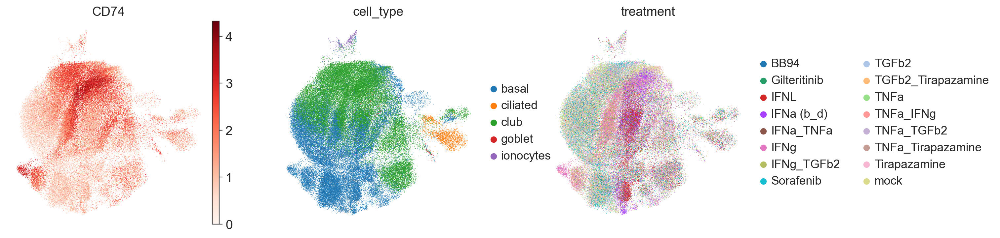

In [248]:
sc.pl.umap(covid, color=['CD74', 'cell_type', 'treatment'], cmap='Reds')

Let's look at the expression of these significant genes in the original heumos data and our dataset.

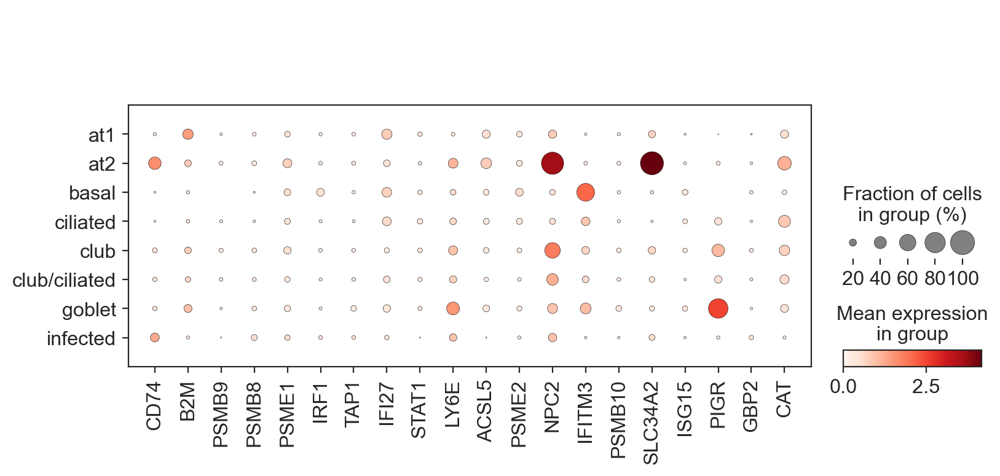

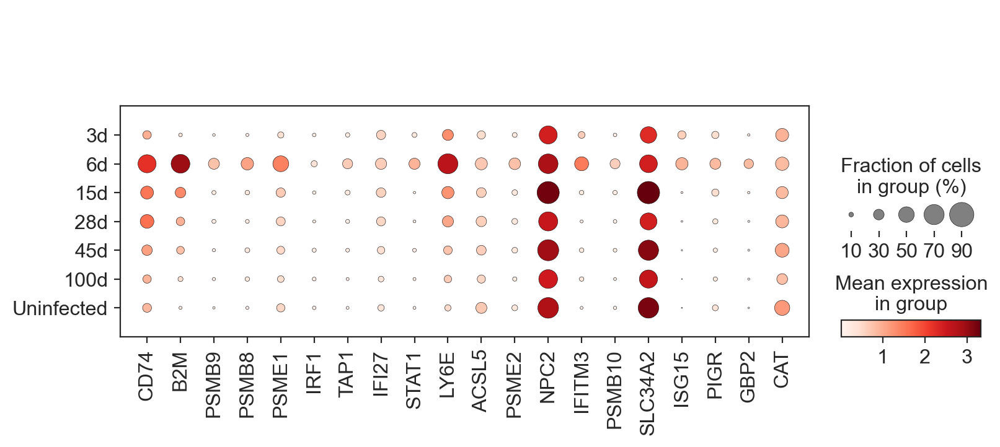

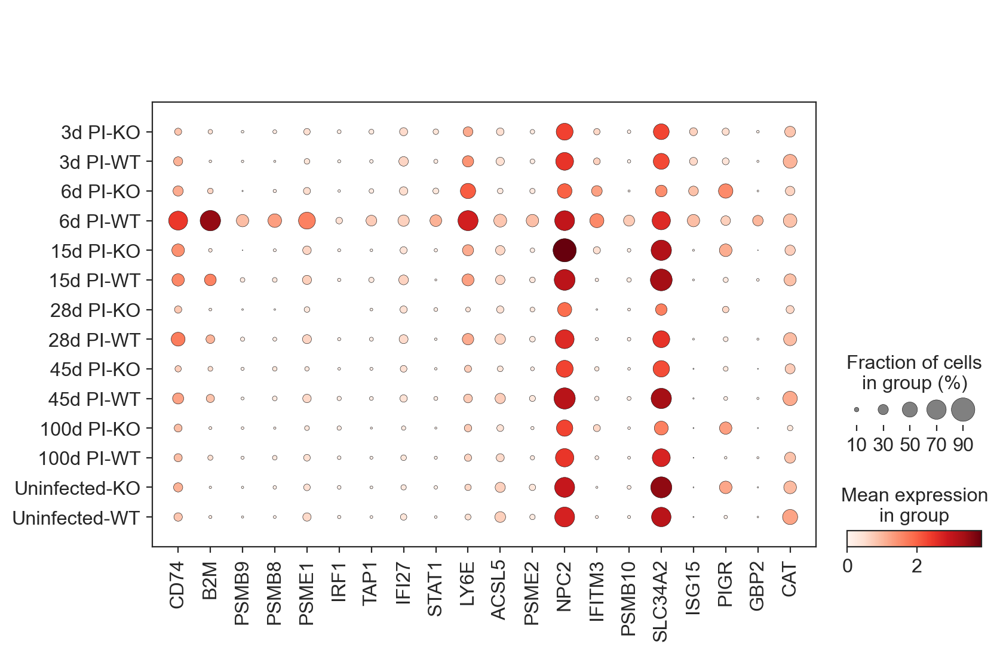

In [251]:
for gb in ['cell_type', 'days', 'grouping']:
#     sc.pl.stacked_violin(heumos, var_names=sig_genes, groupby=gb)
    sc.pl.dotplot(subset, var_names=sig_genes, groupby=gb)